<a href="https://colab.research.google.com/github/jhoeksem/cv2_project/blob/master/household_objects_uncluttered.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# [How to train Detectron2 with Custom COCO Datasets](https://www.dlology.com/blog/how-to-train-detectron2-with-custom-coco-datasets/) | DLology

<img src="https://dl.fbaipublicfiles.com/detectron2/Detectron2-Logo-Horz.png" width="500">

This notebook will help you get started with this framwork by training a instance segmentation model with your custom COCO datasets.

# Install detectron2

In [1]:
!pip install -U torch torchvision
!pip install git+https://github.com/facebookresearch/fvcore.git
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.7/dist-packages (1.8.1+cu101)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.7/dist-packages (0.9.1+cu101)
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-lg4whz0c
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-lg4whz0c
     |████████████████████████████████| 645kB 37.1MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5-cp37-none-any.whl size=63368 sha256=9db84265e9c6a5c3e5abe27d37bc623fe3bdf1f7a867d34dc641c55c054e9168
  Stored in directory: /tmp/pip-ephem-wheel-cache-uqm5yn56/wheels/48/53/79/3c6485543a4455a0006f5db590ab9957622b6227011941de06
Successfully built fvcore
  Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


'1.8.1+cu101'

In [2]:
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 12136, done.
remote: Counting objects: 100% (43/43), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 12136 (delta 11), reused 19 (delta 9), pack-reused 12093
Receiving objects: 100% (12136/12136), 4.79 MiB | 23.23 MiB/s, done.
Resolving deltas: 100% (8848/8848), done.
Obtaining file:///content/detectron2_repo
     |████████████████████████████████| 81kB 9.3MB/s 
     |████████████████████████████████| 153kB 39.2MB/s 
     |████████████████████████████████| 133kB 49.0MB/s 
     |████████████████████████████████| 112kB 46.9MB/s 
     |████████████████████████████████| 727kB 43.2MB/s 
     |████████████████████████████████| 747kB 46.6MB/s 
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.8-cp37-none-any.whl size=141231 sha256=6f12f452c2ec7f09f309c34f0e75a8892637050a744ed4b65824e9deeac8d58a
  Stored in directory: /root/.cache/pip/wheels/e3/e2/fa/b78480b448b8579ddf393bebd3f47ee23

In [1]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import matplotlib.pyplot as plt
import numpy as np
import cv2
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom COCO dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [the fruits nuts segmentation dataset](https://github.com/Tony607/mmdetection_instance_segmentation_demo)
which only has 3 classes: data, fig, and hazelnut.
We'll train a segmentation model from an existing model pre-trained on the COCO dataset, available in detectron2's model zoo.

Note that the COCO dataset does not have the "data", "fig" and "hazelnut" categories.

John: I will import existing images and annotations for my own uncluttered objects database

In [2]:
# download, decompress the data
#!wget https://github.com/Tony607/detectron2_instance_segmentation_demo/releases/download/V0.1/data.zip
#!unzip data.zip > /dev/null

# link google colab
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [3]:
# check for colab connection success
# should display: "eval  models  test  train"
!ls "/content/drive/My Drive/uncluttered_data"

eval  models  test  train


In [4]:
# import files
train_images_path =      "/content/drive/My Drive/uncluttered_data/train/images"
train_annotations_path = "/content/drive/My Drive/uncluttered_data/train/trainval.json"
test_images_path =       "/content/drive/My Drive/uncluttered_data/test/images"
test_annotations_path =  "/content/drive/My Drive/uncluttered_data/test/trainval.json"

Register the fruits_nuts dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).


In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train_uncluttered_data", {}, train_annotations_path, train_images_path)
register_coco_instances("test_uncluttered_data", {}, test_annotations_path, test_images_path)

In [7]:
train_uncluttered_metadata = MetadataCatalog.get("train_uncluttered_data")
dataset_dicts = DatasetCatalog.get("train_uncluttered_data")

test_uncluttered_metadata = MetadataCatalog.get("test_uncluttered_data")
test_dataset_dicts = DatasetCatalog.get("test_uncluttered_data")

WARNING [05/17 00:07:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/17 00:07:07 d2.data.datasets.coco]: Loaded 39 images in COCO format from /content/drive/My Drive/uncluttered_data/train/trainval.json
WARNING [05/17 00:07:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/17 00:07:07 d2.data.datasets.coco]: Loaded 6 images in COCO format from /content/drive/My Drive/uncluttered_data/test/trainval.json


To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the training set:



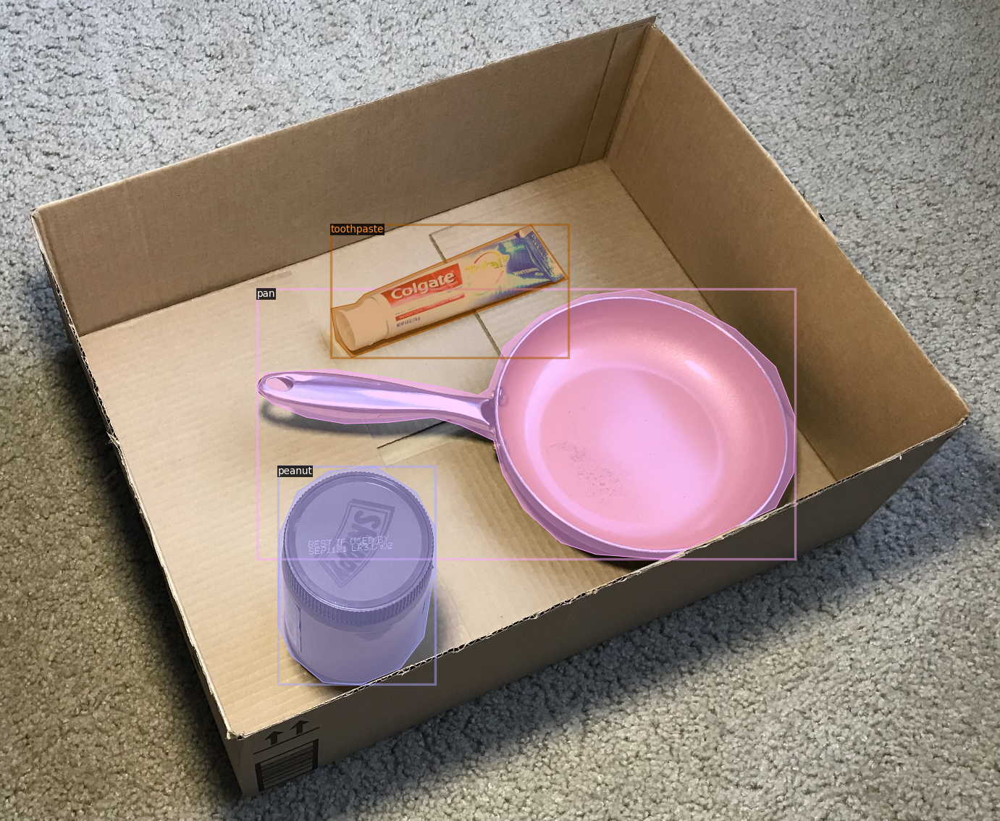

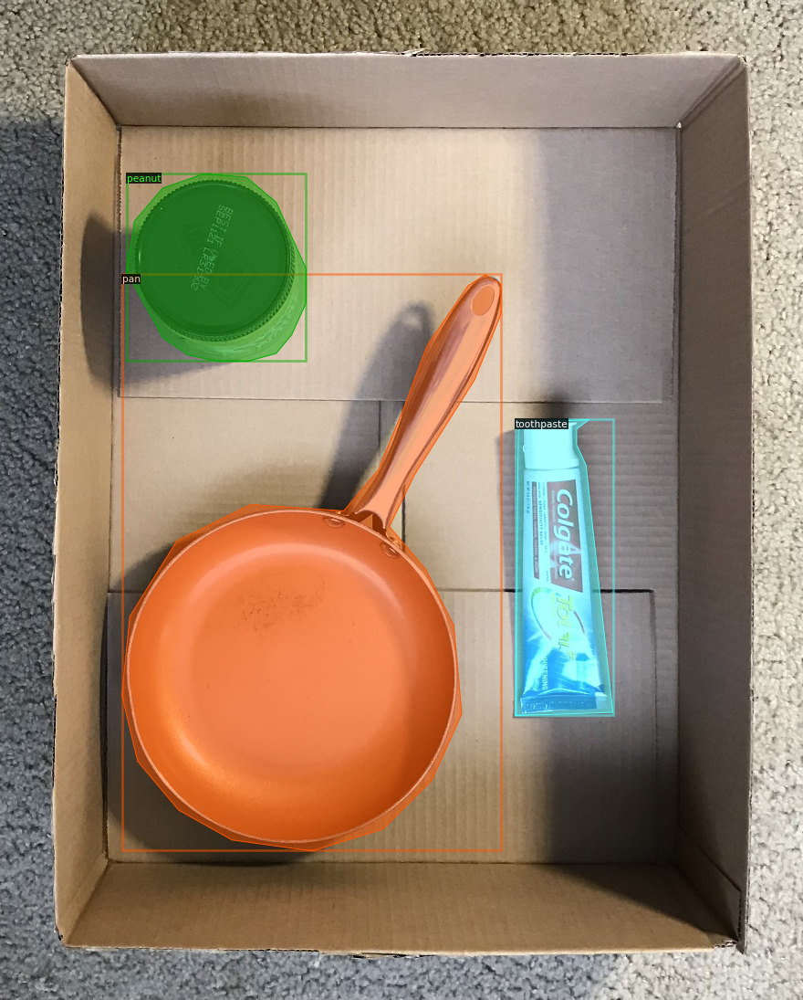

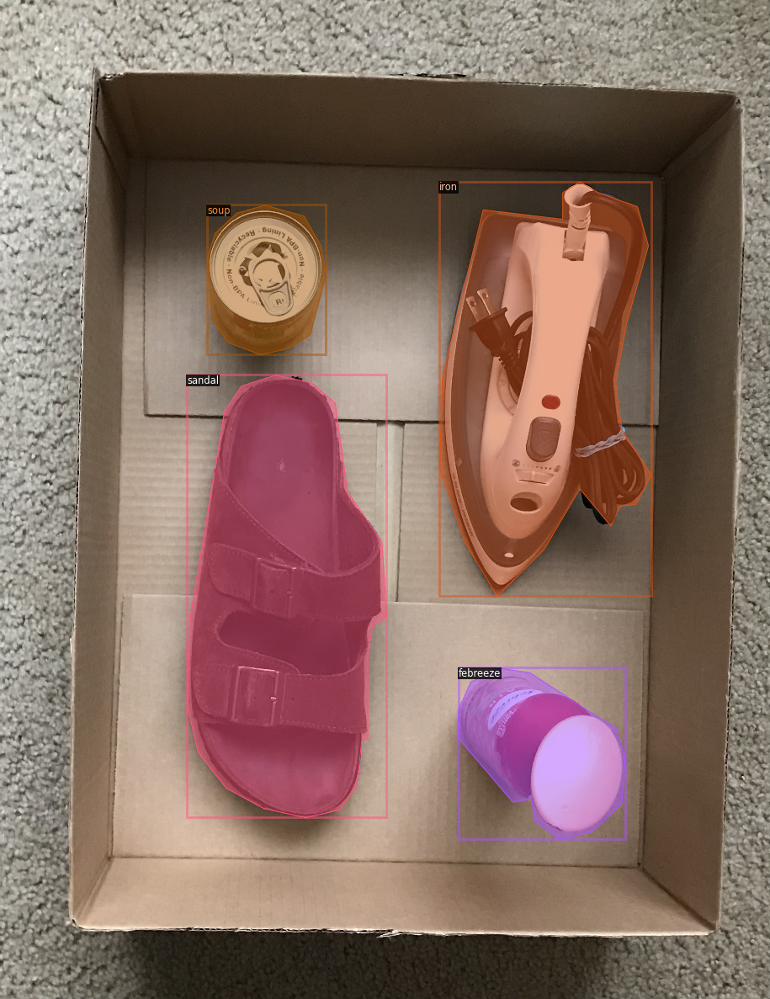

In [8]:
import random

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=train_uncluttered_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

Now, let's fine-tune a coco-pretrained R50-FPN Mask R-CNN model on the fruits_nuts dataset. It takes ~6 minutes to train 300 iterations on Colab's K80 GPU.


In [17]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train_uncluttered_data",)
cfg.DATASETS.TEST = ()   # no metrics implemented for this dataset
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.02
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough, but you can certainly train longer
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 10  # 10 classes
cfg.OUTPUT_DIR = "/content/drive/My Drive/uncluttered_data/models/"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/17 00:38:26 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (11, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (11,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (40, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (40,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (10, 256, 1, 

[05/17 00:38:26 d2.engine.train_loop]: Starting training from iteration 0
[05/17 00:38:41 d2.utils.events]:  eta: 0:03:24  iter: 19  total_loss: 2.745  loss_cls: 1.127  loss_box_reg: 0.9598  loss_mask: 0.6595  loss_rpn_cls: 0.002895  loss_rpn_loc: 0.01155  time: 0.7204  data_time: 0.2869  lr: 0.0012854  max_mem: 2587M
[05/17 00:38:55 d2.utils.events]:  eta: 0:02:57  iter: 39  total_loss: 1.751  loss_cls: 0.6728  loss_box_reg: 0.8723  loss_mask: 0.2355  loss_rpn_cls: 0.001032  loss_rpn_loc: 0.01043  time: 0.6982  data_time: 0.2369  lr: 0.0026174  max_mem: 2587M
[05/17 00:39:09 d2.utils.events]:  eta: 0:02:42  iter: 59  total_loss: 1.057  loss_cls: 0.4699  loss_box_reg: 0.4386  loss_mask: 0.1014  loss_rpn_cls: 0.0001134  loss_rpn_loc: 0.01649  time: 0.7048  data_time: 0.2551  lr: 0.0039494  max_mem: 2587M
[05/17 00:39:23 d2.utils.events]:  eta: 0:02:28  iter: 79  total_loss: 0.7261  loss_cls: 0.2313  loss_box_reg: 0.3824  loss_mask: 0.08614  loss_rpn_cls: 0.0002111  loss_rpn_loc: 0.01045

Now, we perform inference with the trained model on the fruits_nuts dataset. First, let's create a predictor using the model we just trained:



In [18]:
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("test_uncluttered_data", )
predictor = DefaultPredictor(cfg)

# https://towardsdatascience.com/how-to-train-detectron2-on-custom-object-detection-data-be9d1c233e4
evaluator = COCOEvaluator("test_uncluttered_data", cfg, False, output_dir="/content/drive/My Drive/uncluttered_data/eval/")
val_loader = build_detection_test_loader(cfg, "test_uncluttered_data")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [05/17 00:45:54 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/17 00:45:54 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/17 00:45:54 d2.data.datasets.coco]: Loaded 6 images in COCO format from /content/drive/My Drive/uncluttered_data/test/trainval.json
[05/17 00:45:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[05/17 00:45:54 d2.data.common]: Serializing 6 elements to byte tensors and concatenating them all ...
[05/17 00:45:54 d2.data.common]: Serialized dataset takes 0.01 MiB
[05/17 00:45:54 d2.evaluation.evaluator]: Start inference on 6 batches
[05/17 00:45:57 d2.evaluation.evaluator]: Total inference time: 0:00:00.325816 (0.325816 s / iter per device, on 1 devices)
[05/17 00:45

OrderedDict([('bbox',
              {'AP': 64.31188118811882,
               'AP-febreeze': 70.0990099009901,
               'AP-headphones': 75.04950495049505,
               'AP-iron': 70.0990099009901,
               'AP-pan': 42.524752475247524,
               'AP-peanut': 37.57425742574257,
               'AP-sandal': 70.0990099009901,
               'AP-soup': 70.0,
               'AP-soy': 72.52475247524752,
               'AP-spoon': 65.04950495049505,
               'AP-toothpaste': 70.0990099009901,
               'AP50': 100.0,
               'AP75': 82.52475247524752,
               'APl': 64.31188118811882,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': 81.28217821782178,
               'AP-febreeze': 95.04950495049505,
               'AP-headphones': 80.0,
               'AP-iron': 90.0,
               'AP-pan': 90.0,
               'AP-peanut': 55.049504950495056,
               'AP-sandal': 90.0990099009901,
          

Then, we randomly select several samples to visualize the prediction results.

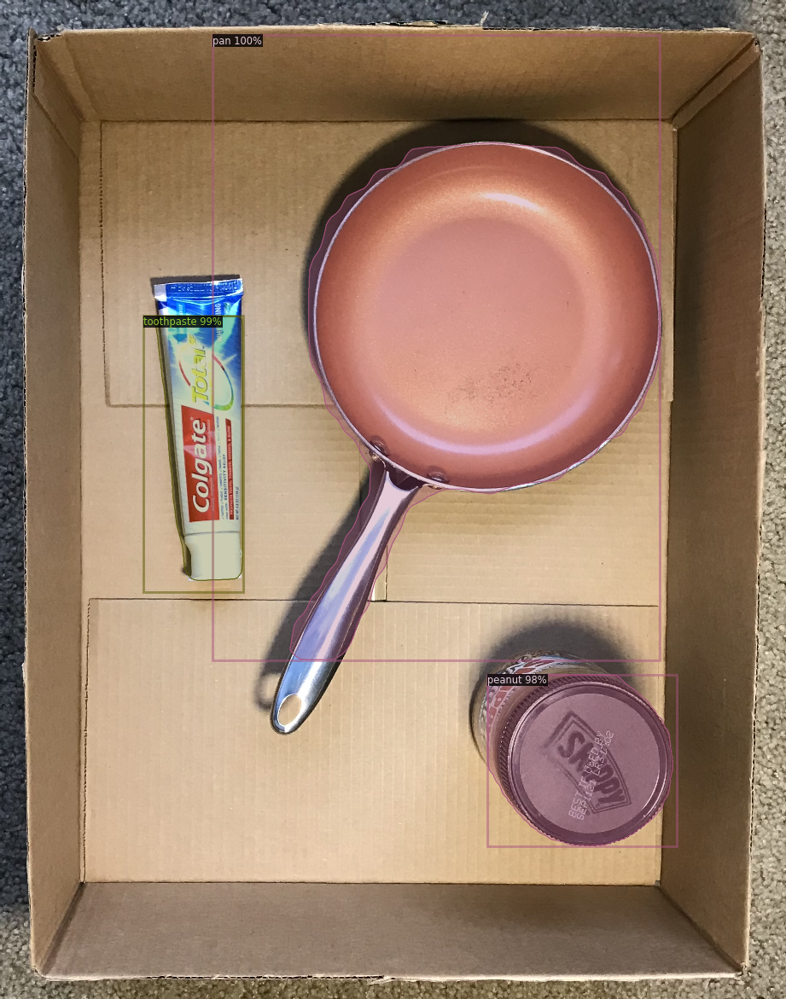

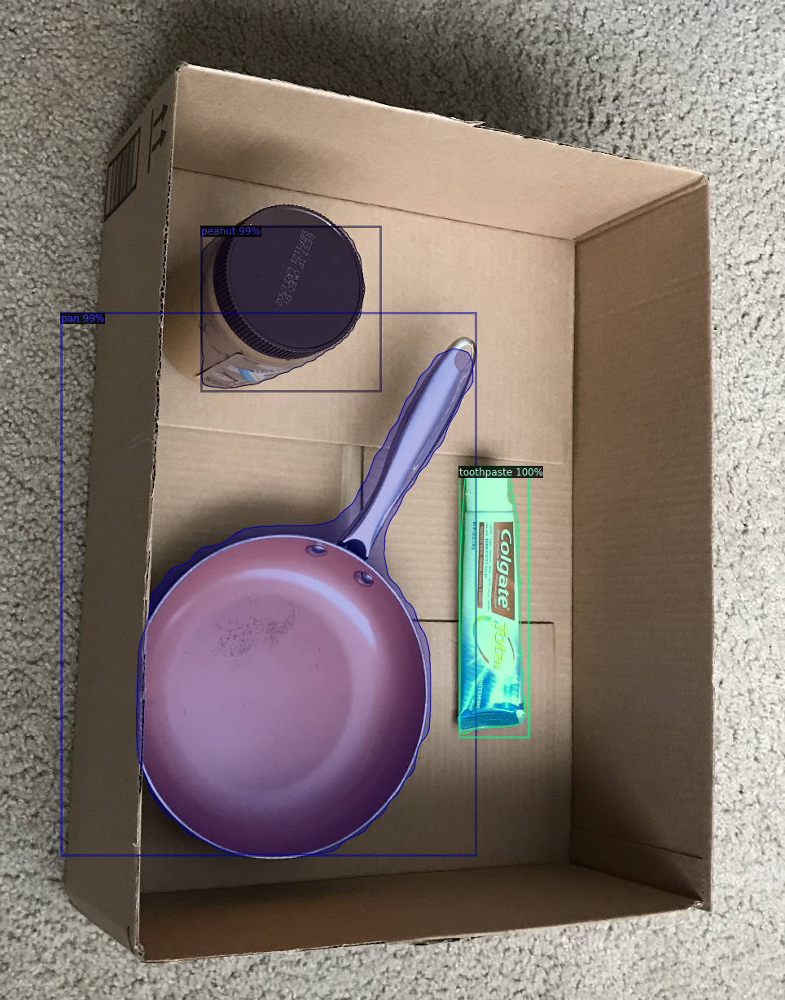

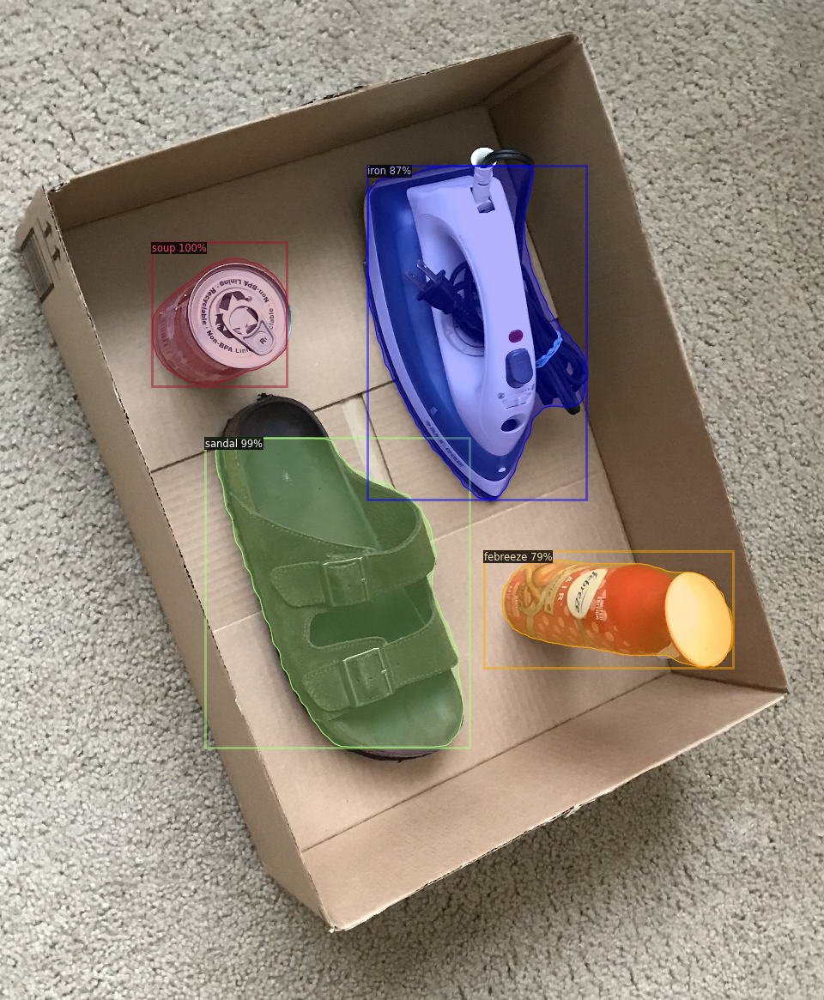

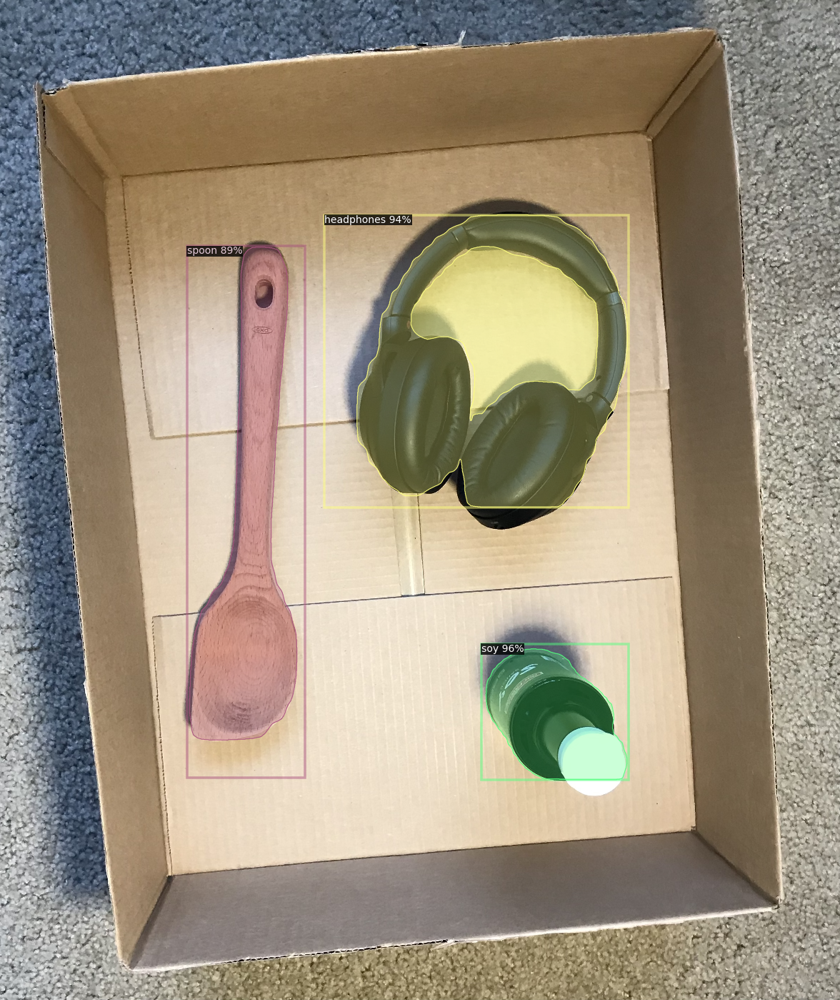

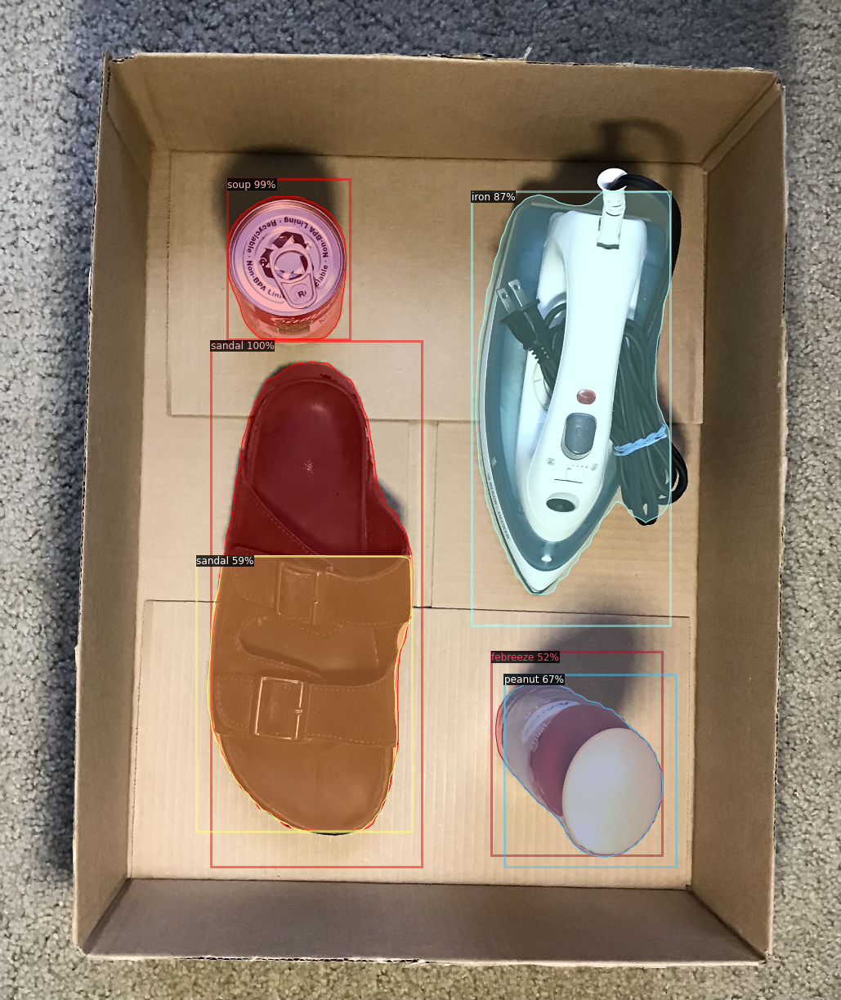

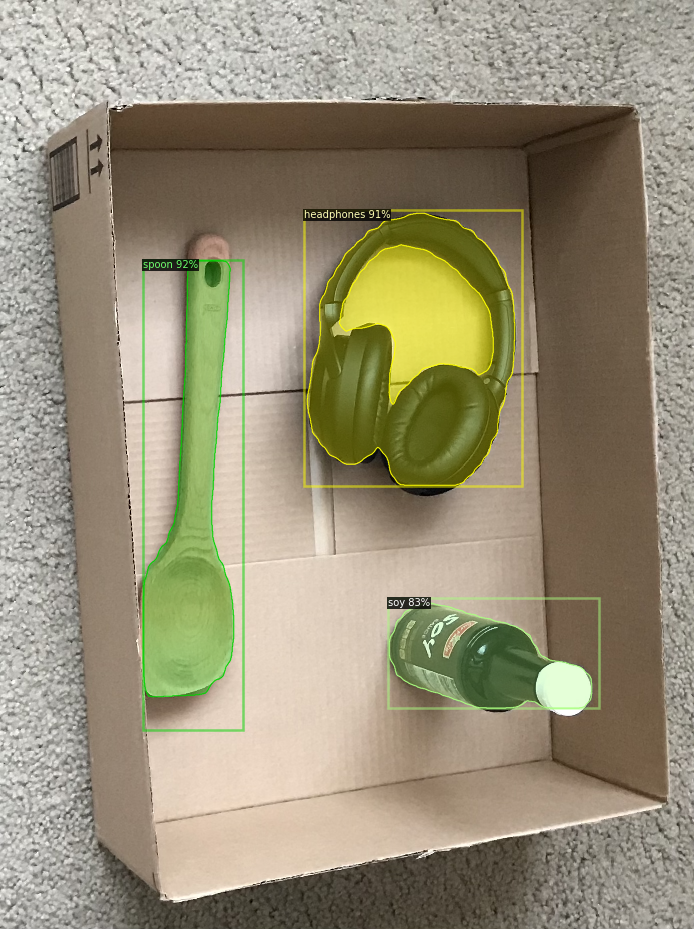

In [19]:
from detectron2.utils.visualizer import ColorMode
import detectron2.structures as structures
import torch
import numpy as np

for d in test_dataset_dicts:
    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)

    """
    bboxes_lists = []
    for i in range(len(d["annotations"])):
        print(d["annotations"][i]["bbox"])
        bboxes_lists.append(d["annotations"][i]["bbox"])
    #print(bbox_lists)
    bboxes_numpy = np.array(bbox_lists)
    #print(bbox_numpy)

    
    # https://stackoverflow.com/questions/64384223/how-can-i-calculate-intersection-over-union-in-detectron2
    bboxes_gt = structures.Boxes(torch.Tensor(bboxes_numpy))
    print(bboxes_gt)
    bboxes_pred = outputs["instances"].pred_boxes.to("cpu")
    print(bboxes_pred)
    IOUs = structures.pairwise_iou(bboxes_gt, bboxes_pred)
    print(IOUs)
    """

    v = Visualizer(im[:, :, ::-1],
                   metadata=test_uncluttered_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    
